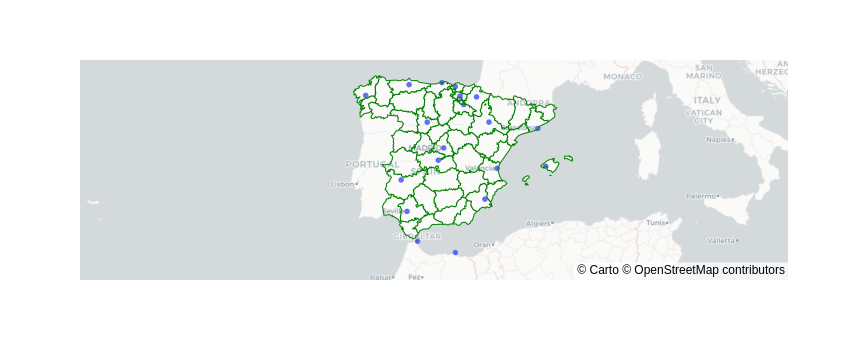

In [2]:
import requests
import plotly.express as px
import pandas as pd

# get Spain municipal boundaries

res = requests.get(
    "https://raw.githubusercontent.com/codeforgermany/click_that_hood/main/public/data/spain-provinces.geojson"
)

# get some cities in Spain
df = (
    pd.json_normalize(
        requests.get(
            "https://opendata.arcgis.com/datasets/6996f03a1b364dbab4008d99380370ed_0.geojson"
        ).json()["features"]
    )
    .loc[
        lambda d: d["properties.CNTRY_NAME"].eq("Spain"),
        ["properties.CITY_NAME", "geometry.coordinates"],
    ]
    .assign(
        lon=lambda d: d["geometry.coordinates"].apply(lambda v: v[0]),
        lat=lambda d: d["geometry.coordinates"].apply(lambda v: v[1]),
    )
)

# scatter the cities and add layer that shows municiple boundary
px.scatter_mapbox(df, lat="lat", lon="lon", hover_name="properties.CITY_NAME").update_layout(
    mapbox={
        "style": "carto-positron",
        "zoom": 3.5,
        "layers": [
            {
                "source": res.json(),
                "type": "line",
                "color": "green",
                "line": {"width": 1},
            }
        ],
    }
)


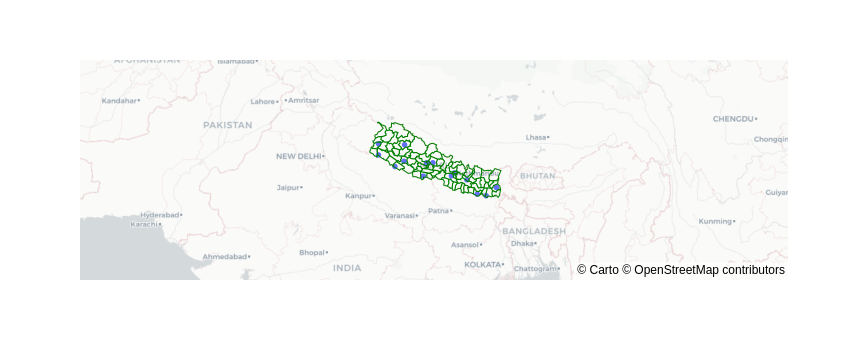

In [18]:
import requests
import plotly.express as px
import pandas as pd
import geopandas as gpd
import json

# get Spain municipal boundaries
with open("nepal-with-districts.geojson","r") as file:
    jsonData = json.load(file)

# get some cities in Spain
df = (
    pd.json_normalize(
        requests.get(
            "https://opendata.arcgis.com/datasets/6996f03a1b364dbab4008d99380370ed_0.geojson"
        ).json()["features"]
    )
    .loc[
        lambda d: d["properties.CNTRY_NAME"].eq("Nepal"),
        ["properties.CITY_NAME", "geometry.coordinates"],
    ]
    .assign(
        lon=lambda d: d["geometry.coordinates"].apply(lambda v: v[0]),
        lat=lambda d: d["geometry.coordinates"].apply(lambda v: v[1]),
    )
)

# scatter the cities and add layer that shows municiple boundary
px.scatter_mapbox(df, lat="lat", lon="lon", hover_name="properties.CITY_NAME").update_layout(
    mapbox={
        "style": "carto-positron",
        "zoom": 3.5,
        "layers": [
            {
                "source": jsonData,
                "type": "line",
                "color": "green",
                "line": {"width": 1},
            }
        ],
    }
)

In [19]:
res = requests.get("https://raw.githubusercontent.com/codeforgermany/click_that_hood/main/public/data/spain-provinces.geojson")

In [16]:
res.json()

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[3.213645, 39.957514],
       [3.154396, 39.923218],
       [3.138386, 39.928085],
       [3.131327, 39.926868],
       [3.110792, 39.899265],
       [3.080042, 39.902273],
       [3.083787, 39.875484],
       [3.105639, 39.857654],
       [3.190364, 39.892422],
       [3.20446, 39.888812],
       [3.188253, 39.881623],
       [3.197213, 39.861858],
       [3.178545, 39.84058],
       [3.120768, 39.832087],
       [3.135069, 39.782669],
       [3.252588, 39.729367],
       [3.328908, 39.7598],
       [3.34812, 39.789369],
       [3.432189, 39.745099],
       [3.461318, 39.748104],
       [3.452687, 39.722487],
       [3.478685, 39.715805],
       [3.456705, 39.705505],
       [3.452354, 39.682232],
       [3.455938, 39.656305],
       [3.441007, 39.65648],
       [3.436287, 39.63427],
       [3.396889, 39.628311],
       [3.385017, 39.592797],
       [3.404074, 

In [11]:
type(res)

requests.models.Response

In [14]:
px.scatter_mapbox?

Signature:
px.scatter_mapbox(
    data_frame=None,
    lat=None,
    lon=None,
    color=None,
    text=None,
    hover_name=None,
    hover_data=None,
    custom_data=None,
    size=None,
    animation_frame=None,
    animation_group=None,
    category_orders=None,
    labels=None,
    color_discrete_sequence=None,
    color_discrete_map=None,
    color_continuous_scale=None,
    range_color=None,
    color_continuous_midpoint=None,
    opacity=None,
    size_max=None,
    zoom=8,
    center=None,
    mapbox_style=None,
    title=None,
    template=None,
    width=None,
    height=None,
) -> plotly.graph_objs._figure.Figure
Docstring:
    In a Mapbox scatter plot, each row of `data_frame` is represented by a
    symbol mark on a Mapbox map.
    
Parameters
----------
data_frame: DataFrame or array-like or dict
    This argument needs to be passed for column names (and not keyword
    names) to be used. Array-like and dict are transformed internally to a
    pandas DataFrame. Optional: